# MAJOR PROJECT-1:

1. Load dataset from - https://covid.ourworldindata.org/data/owid-covid-data.csv
2. Subset only those rows that have “India” in the “location” column(This subsetted
dataframe has to be used for modelling)
3. Handle Missing values:<br/>
a. If there are null values in continuous numerical column, replace the null values by
the mean of that column<br/>
b. If there are null values in ordinal numerical column, replace the null values by the
mode of that column<br/>
c. If there are null values in categorical column, replace the null values by the mode
of that column<br/>
d. If more than 50%the values in a column are null, then drop that entire column<br/>
4. Univariate Analysis:<br/>
a. Draw histograms of 10 feature columns<br/>
b. Find mean, median and mode of each column<br/>
5. Bivariate Analysis:<br/>
a. Draw scatter plots of target column versus 10 features<br/>
b. Draw line plots of target column versus 10 features<br/>
6. Convert date column to ordinal<br/>
7. Drop useless categorical columns, and convert useful categorical to numerical by
labelencoder<br/>
8. Select “total_cases” column as the target variable
9. Select the other columns as the features(NOTE: the “date” column has to be
compulsorily in the features)
10. Perform train-test split
11. Modelling:<br/>
a. Linear Regression<br/>
b. Random Forest Regressor<br/>
12. Get accuracy
13. Predict Total case for a new date

In [1]:
#importing necessary python libraries
import pandas as pd
import numpy as np
import matplotlib as pyplot
import seaborn as sns

## LOADING THE DATA SET:

In [2]:
#impoting dataset
data=pd.read_csv("covid-data.csv")
data.head()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
0,AFG,Asia,Afghanistan,2019-12-31,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83
1,AFG,Asia,Afghanistan,2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83
2,AFG,Asia,Afghanistan,2020-01-02,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83
3,AFG,Asia,Afghanistan,2020-01-03,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83
4,AFG,Asia,Afghanistan,2020-01-04,0.0,0.0,0.0,0.0,0.0,0.0,...,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83


### VISUALIZATION:
    Data sets are visualized with the help of graphical libraries to get an quick insights from the datasets.

In [3]:
#importing plotly express library
import plotly.express as px                

In [4]:
fig=px.scatter(data,x="new_cases",y="total_cases",animation_frame="date",animation_group="location",hover_name="location")
fig.show()                                #creating animated scatter plot

In [5]:
px.choropleth(data, locations="iso_code", color="total_cases", hover_name="location", animation_frame="date",
              color_continuous_scale=px.colors.sequential.Plasma, projection="natural earth")  
                                         #creating animated choropleth plot for visualization

## SUBSETTING THE DATAS WITH REQUIRED COLUMNS:

In [3]:
#susbsetting the location column with india
data1=data[data["location"]=="India"]
data1.tail()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
15630,IND,Asia,India,2020-08-10,2215074.0,62064.0,44386.0,1007.0,1605.121,44.974,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
15631,IND,Asia,India,2020-08-11,2268675.0,53601.0,45257.0,871.0,1643.962,38.841,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
15632,IND,Asia,India,2020-08-12,2329638.0,60963.0,46091.0,834.0,1688.138,44.176,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
15633,IND,Asia,India,2020-08-13,2396637.0,66999.0,47033.0,942.0,1736.688,48.550,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
15634,IND,Asia,India,2020-08-14,2461190.0,64553.0,48040.0,1007.0,1783.465,46.777,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66


In [7]:
#Summaring the subsetted datas
data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 227 entries, 15408 to 15634
Data columns (total 36 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   iso_code                         227 non-null    object 
 1   continent                        227 non-null    object 
 2   location                         227 non-null    object 
 3   date                             227 non-null    object 
 4   total_cases                      227 non-null    float64
 5   new_cases                        227 non-null    float64
 6   total_deaths                     227 non-null    float64
 7   new_deaths                       227 non-null    float64
 8   total_cases_per_million          227 non-null    float64
 9   new_cases_per_million            227 non-null    float64
 10  total_deaths_per_million         227 non-null    float64
 11  new_deaths_per_million           227 non-null    float64
 12  new_tests       

In [8]:
data1.isnull().sum() #It returns the total sum of null values present in each columns

iso_code                            0
continent                           0
location                            0
date                                0
total_cases                         0
new_cases                           0
total_deaths                        0
new_deaths                          0
total_cases_per_million             0
new_cases_per_million               0
total_deaths_per_million            0
new_deaths_per_million              0
new_tests                          90
total_tests                        84
total_tests_per_thousand           84
new_tests_per_thousand             90
new_tests_smoothed                 79
new_tests_smoothed_per_thousand    79
tests_per_case                     79
positive_rate                      79
tests_units                        72
stringency_index                    8
population                          0
population_density                  0
median_age                          0
aged_65_older                       0
aged_70_olde

## HANDLING MISSING VALUES:

In [9]:
#Finding the percentage of null values present in iso_code column:
data1["iso_code"].isna()   #It returns false, if null value is not found

15408    False
15409    False
15410    False
15411    False
15412    False
         ...  
15630    False
15631    False
15632    False
15633    False
15634    False
Name: iso_code, Length: 227, dtype: bool

In [10]:
data1["iso_code"].isna().sum()    #It returns the total sum of null values found

0

###### Percentage of null values found = (Sum of null values found in rows)  /  (Total number of rows )

In [11]:
percent=(data1["iso_code"].isna().sum()/227)*100
print("Percentage of null values present in the iso_code column is:",percent)  #It returns the percentage of null values found

Percentage of null values present in the iso_code column is: 0.0


As the percentage value is not less than 50, thers is no need to drop the iso_code column.

In [12]:
#Finding the percentage of null values in each columns present in dataset:
(data1.isna().sum()/227)*100 

iso_code                            0.000000
continent                           0.000000
location                            0.000000
date                                0.000000
total_cases                         0.000000
new_cases                           0.000000
total_deaths                        0.000000
new_deaths                          0.000000
total_cases_per_million             0.000000
new_cases_per_million               0.000000
total_deaths_per_million            0.000000
new_deaths_per_million              0.000000
new_tests                          39.647577
total_tests                        37.004405
total_tests_per_thousand           37.004405
new_tests_per_thousand             39.647577
new_tests_smoothed                 34.801762
new_tests_smoothed_per_thousand    34.801762
tests_per_case                     34.801762
positive_rate                      34.801762
tests_units                        31.718062
stringency_index                    3.524229
population

As the percentage value is not less than 50, thers is no need to drop the any columns from the dataset.

# REPLACING THE NULL VALUES:

1.Replace the null values present in the categoiacal type column by mode.<br/>
2.Replace the null values present in the ordinal numeric type column by mode.<br/>
3.Replace the null values present in the continuous numeric type column by mean.<br/>

In [13]:
#ordinal means finite set of values and continuous means infinite set of values.

In [4]:
#Replacing the null values present in numeric columns with mean 
data1.fillna(data1.mean(),inplace=True)

C:\Users\ELCOT\anaconda3\lib\site-packages\pandas\core\generic.py:6245: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(new_data)


In [5]:
data1["tests_units"].mode()       #It return the mode in the form of series

0    samples tested
dtype: object

In [6]:
type(data1["tests_units"].mode())

pandas.core.series.Series

In [7]:
data1["tests_units"].mode()[0]     #It returns the mode as a single value in string

'samples tested'

In [8]:
type(data1["tests_units"].mode()[0])

str

In [9]:
#Replacing the null values present in categorical columns with mode 
data1["tests_units"].fillna(data1["tests_units"].mode()[0],inplace=True)

In [10]:
data1.isna().sum()

iso_code                           0
continent                          0
location                           0
date                               0
total_cases                        0
new_cases                          0
total_deaths                       0
new_deaths                         0
total_cases_per_million            0
new_cases_per_million              0
total_deaths_per_million           0
new_deaths_per_million             0
new_tests                          0
total_tests                        0
total_tests_per_thousand           0
new_tests_per_thousand             0
new_tests_smoothed                 0
new_tests_smoothed_per_thousand    0
tests_per_case                     0
positive_rate                      0
tests_units                        0
stringency_index                   0
population                         0
population_density                 0
median_age                         0
aged_65_older                      0
aged_70_older                      0
g

All the null values of the columns are replaced with the respective mean and mode of their columns.

### DESCRIPTIVE STATISTICS:

1.To measure the central tendencies such as Mean, Meadian and Mode.<br/>
2.To measure the variation such as Variance, Standard variations.

In [21]:
data1.describe(include="all")         #to evaluate the descriptive statistics of the dataset

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
count,227,227,227,227,2.270000e+02,227.000000,227.000000,227.000000,227.000000,227.000000,...,2.270000e+02,2.270000e+02,2.270000e+02,2.270000e+02,2.270000e+02,2.270000e+02,2.270000e+02,2.270000e+02,2.270000e+02,2.270000e+02
unique,1,1,1,227,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,IND,Asia,India,2020-03-16,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,227,227,227,1,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,3.284827e+05,10842.246696,7955.806167,211.629956,238.030150,7.856670,...,3.414000e+00,6.426674e+03,2.120000e+01,2.822800e+02,1.039000e+01,1.900000e+00,2.060000e+01,5.955000e+01,5.300000e-01,6.966000e+01
std,NaN,NaN,NaN,NaN,5.797864e+05,17471.961003,12628.837019,304.224220,420.133728,12.660778,...,9.791554e-15,3.281417e-11,8.901412e-14,7.975666e-13,2.314367e-14,6.898595e-15,1.068169e-14,2.065128e-13,8.901412e-16,1.139381e-13
min,NaN,NaN,NaN,NaN,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.414000e+00,6.426674e+03,2.120000e+01,2.822800e+02,1.039000e+01,1.900000e+00,2.060000e+01,5.955000e+01,5.300000e-01,6.966000e+01
25%,NaN,NaN,NaN,NaN,3.000000e+00,0.000000,0.000000,0.000000,0.002000,0.000000,...,3.414000e+00,6.426674e+03,2.120000e+01,2.822800e+02,1.039000e+01,1.900000e+00,2.060000e+01,5.955000e+01,5.300000e-01,6.966000e+01
50%,NaN,NaN,NaN,NaN,2.139300e+04,1409.000000,681.000000,47.000000,15.502000,1.021000,...,3.414000e+00,6.426674e+03,2.120000e+01,2.822800e+02,1.039000e+01,1.900000e+00,2.060000e+01,5.955000e+01,5.300000e-01,6.966000e+01
75%,NaN,NaN,NaN,NaN,3.737390e+05,13233.500000,12405.000000,377.000000,270.824500,9.589500,...,3.414000e+00,6.426674e+03,2.120000e+01,2.822800e+02,1.039000e+01,1.900000e+00,2.060000e+01,5.955000e+01,5.300000e-01,6.966000e+01


In [22]:
data1.mean()                              #it prints the mean values from each columns of the dataset

total_cases                        3.284827e+05
new_cases                          1.084225e+04
total_deaths                       7.955806e+03
new_deaths                         2.116300e+02
total_cases_per_million            2.380301e+02
new_cases_per_million              7.856670e+00
total_deaths_per_million           5.765062e+00
new_deaths_per_million             1.533480e-01
new_tests                          2.011644e+05
total_tests                        6.908369e+06
total_tests_per_thousand           5.006063e+00
new_tests_per_thousand             1.457883e-01
new_tests_smoothed                 1.716625e+05
new_tests_smoothed_per_thousand    1.243851e-01
tests_per_case                     1.929039e+01
positive_rate                      6.443243e-02
stringency_index                   5.825808e+01
population                         1.380004e+09
population_density                 4.504190e+02
median_age                         2.820000e+01
aged_65_older                      5.989

In [23]:
data1.median()                              #it prints the median values from each columns of the dataset

total_cases                        2.139300e+04
new_cases                          1.409000e+03
total_deaths                       6.810000e+02
new_deaths                         4.700000e+01
total_cases_per_million            1.550200e+01
new_cases_per_million              1.021000e+00
total_deaths_per_million           4.930000e-01
new_deaths_per_million             3.400000e-02
new_tests                          2.011644e+05
total_tests                        6.908369e+06
total_tests_per_thousand           5.006063e+00
new_tests_per_thousand             1.457883e-01
new_tests_smoothed                 1.716625e+05
new_tests_smoothed_per_thousand    1.243851e-01
tests_per_case                     1.929039e+01
positive_rate                      6.443243e-02
stringency_index                   7.639000e+01
population                         1.380004e+09
population_density                 4.504190e+02
median_age                         2.820000e+01
aged_65_older                      5.989

In [11]:
data1.mode().head(1)                              #it prints the mode values from each columns of the dataset

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
0,IND,Asia,India,2019-12-31,0.0,0.0,0.0,0.0,0.0,0.0,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66


### DATA VISUALIZATION:

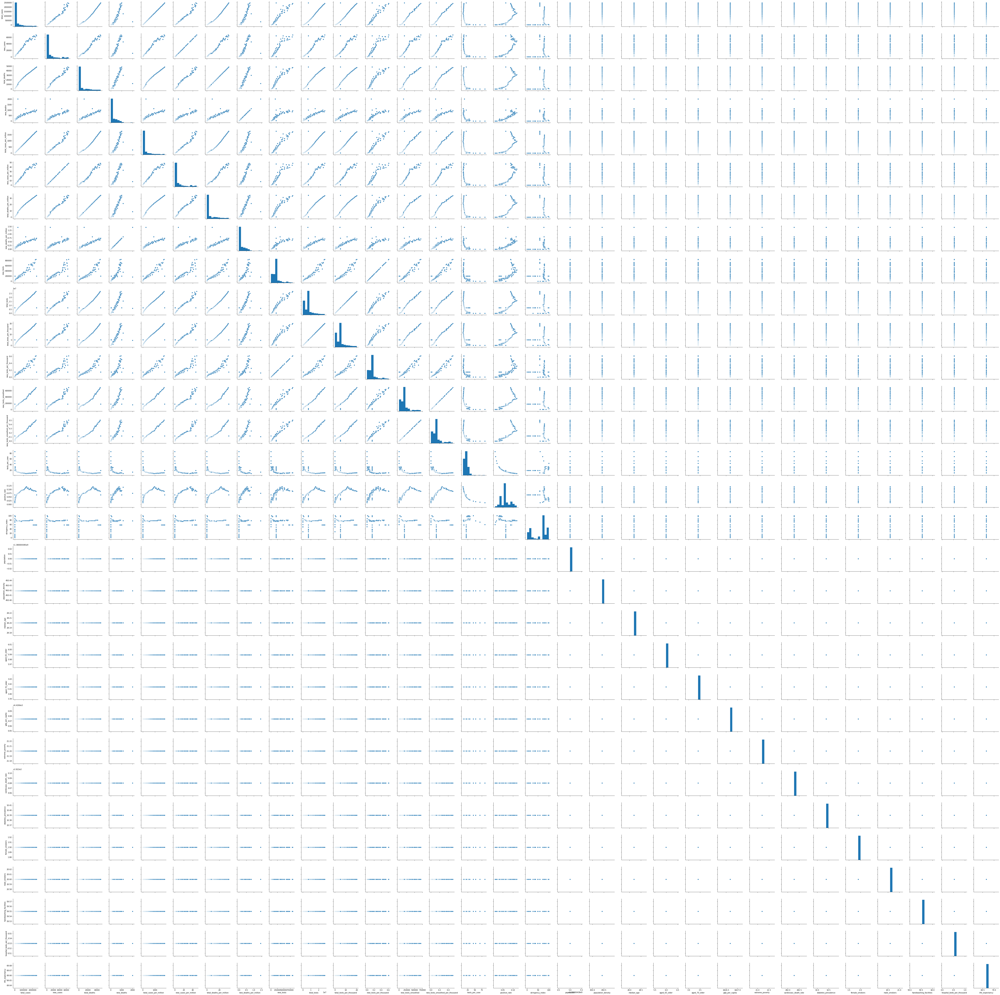

In [28]:
sns.pairplot(data1)                 #it plots different histograms and scateer plots for the dataset

# UNI-VARIATE ANALYSIS:

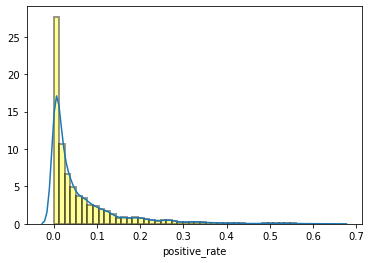

In [29]:
#Histograms are usually used for uni-variate analysis
sns.distplot(data['positive_rate'],kde=True,hist=True,hist_kws=dict(edgecolor="k",linewidth=2,color="yellow"))

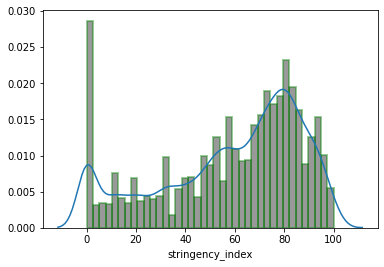

In [30]:
sns.distplot(data['stringency_index'],kde=True,hist=True,hist_kws=dict(edgecolor="g",linewidth=2,color='black'))

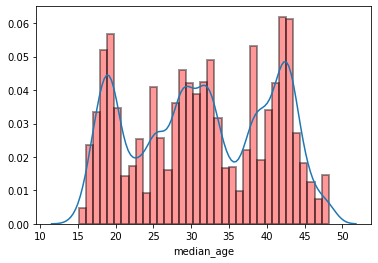

In [31]:
sns.distplot(data['median_age'],kde=True,hist=True,hist_kws=dict(edgecolor="k",linewidth=2,color='Red'))

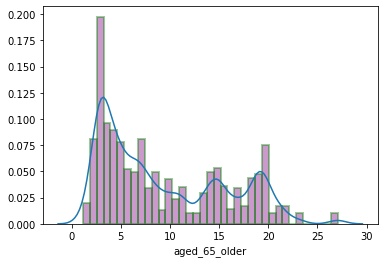

In [32]:
sns.distplot(data['aged_65_older'],kde=True,hist=True,hist_kws=dict(edgecolor="g",linewidth=2,color='purple'))

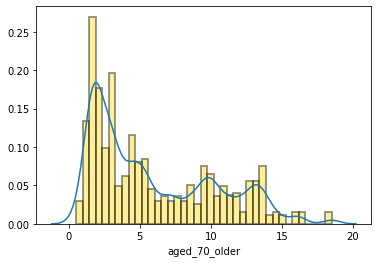

In [33]:
sns.distplot(data['aged_70_older'],kde=True,hist=True,hist_kws=dict(edgecolor="k",linewidth=2,color='gold'))

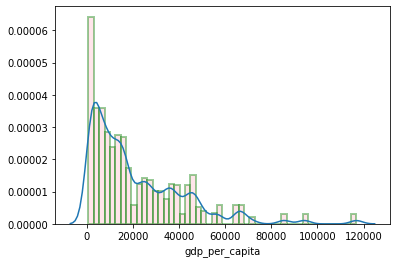

In [34]:
sns.distplot(data['gdp_per_capita'],kde=True,hist=True,hist_kws=dict(edgecolor="g",linewidth=2,color='pink'))

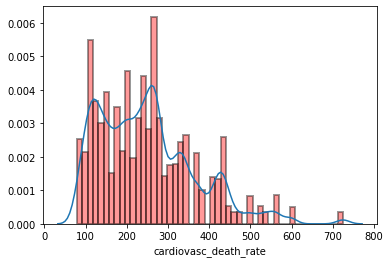

In [35]:
sns.distplot(data['cardiovasc_death_rate'],kde=True,hist=True,hist_kws=dict(edgecolor="k",linewidth=2,color='Red'))

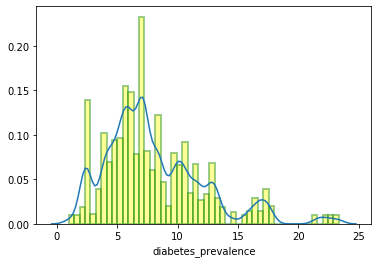

In [36]:
sns.distplot(data['diabetes_prevalence'],kde=True,hist=True,hist_kws=dict(edgecolor="g",linewidth=2,color='yellow'))

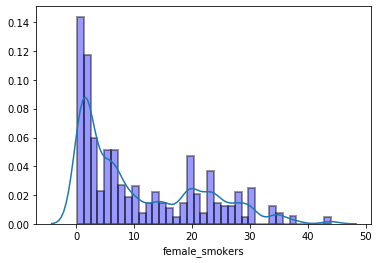

In [37]:
sns.distplot(data['female_smokers'],kde=True,hist=True,hist_kws=dict(edgecolor="k",linewidth=2,color='blue'))

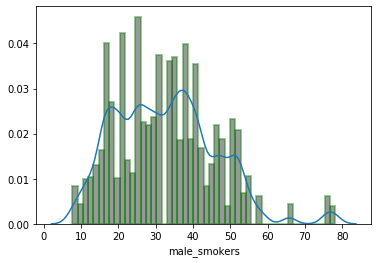

In [38]:
sns.distplot(data['male_smokers'],kde=True,hist=True,hist_kws=dict(edgecolor="g",linewidth=2,color='black'))

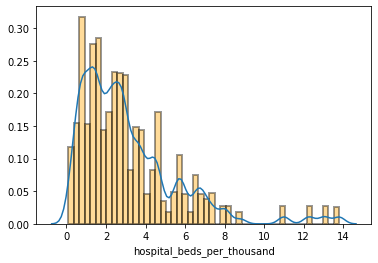

In [39]:
sns.distplot(data['hospital_beds_per_thousand'],kde=True,hist=True,hist_kws=dict(edgecolor="k",linewidth=2,color='orange'))

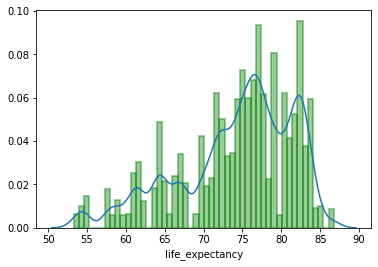

In [40]:
sns.distplot(data['life_expectancy'],kde=True,hist=True,hist_kws=dict(edgecolor="g",linewidth=2,color='green'))

### BI-VARIATE ANALYSIS:

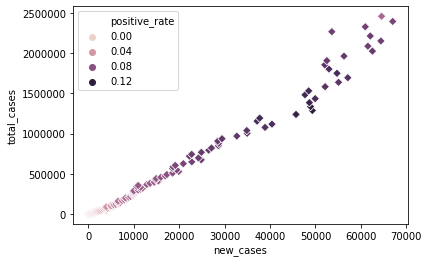

In [41]:
#Scatter plots and line plots are used for Bi-Variate analysis
sns.scatterplot(x="new_cases", y="total_cases", data=data1,color='green',marker='D',hue="positive_rate")

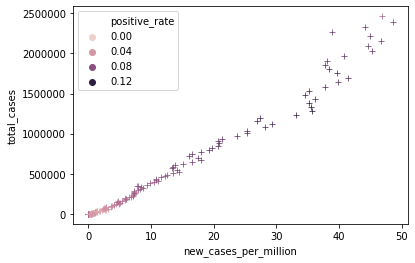

In [42]:
sns.scatterplot(x="new_cases_per_million", y="total_cases", data=data1,marker='+',hue="positive_rate")

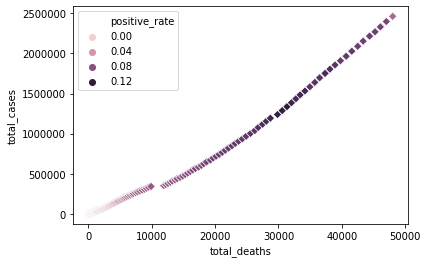

In [43]:
sns.scatterplot(x="total_deaths", y="total_cases", data=data1,color='r',marker='D',hue="positive_rate")

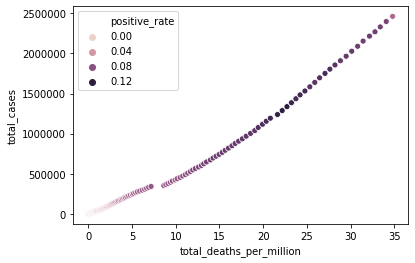

In [44]:
sns.scatterplot(x="total_deaths_per_million",y="total_cases",data=data1,hue="positive_rate")

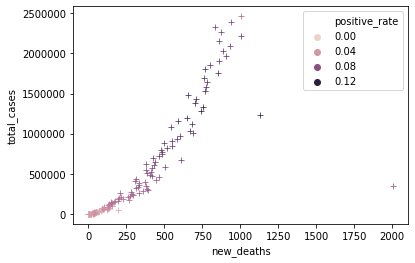

In [45]:
sns.scatterplot(x="new_deaths", y="total_cases", data=data1,marker='+',hue="positive_rate")

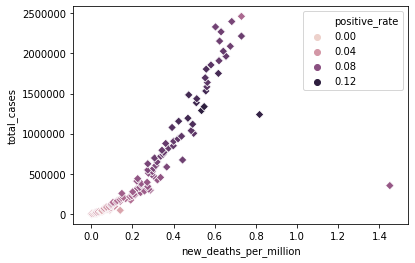

In [46]:
sns.scatterplot(x="new_deaths_per_million", y="total_cases", data=data1,marker='D',hue="positive_rate")

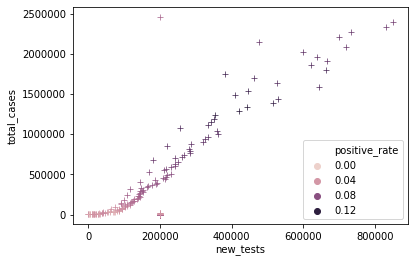

In [47]:
sns.scatterplot(x="new_tests", y="total_cases", data=data1,marker='+',hue="positive_rate")

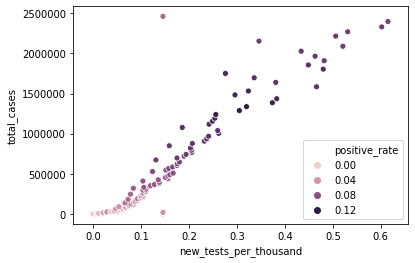

In [48]:
sns.scatterplot(x="new_tests_per_thousand", y="total_cases", data=data1,hue="positive_rate")

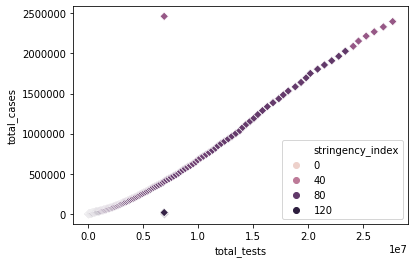

In [49]:
sns.scatterplot(x="total_tests", y="total_cases", data=data1,marker='D',hue='stringency_index')

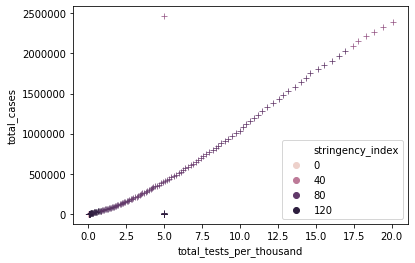

In [50]:
sns.scatterplot(x="total_tests_per_thousand",y="total_cases", data=data1,marker='+',hue='stringency_index')

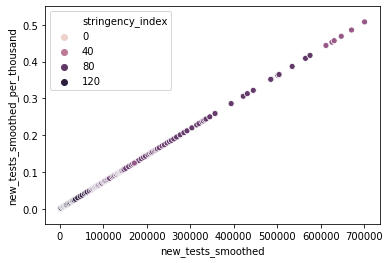

In [51]:
sns.scatterplot(x="new_tests_smoothed", y="new_tests_smoothed_per_thousand", data=data1,hue='stringency_index')

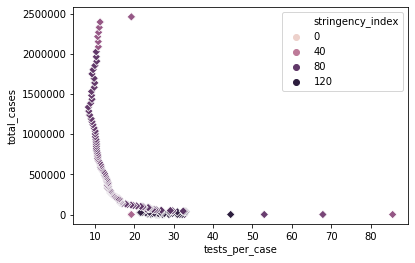

In [52]:
sns.scatterplot(x="tests_per_case", y="total_cases", data=data1,marker='D',hue='stringency_index')

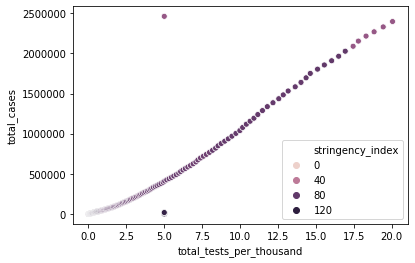

In [53]:
sns.scatterplot(x="total_tests_per_thousand",y="total_cases", data=data1,hue='stringency_index')

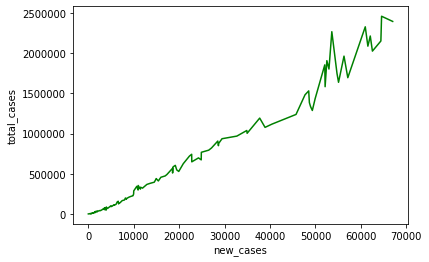

In [54]:
sns.lineplot(x="new_cases", y="total_cases", data=data1,color='g')

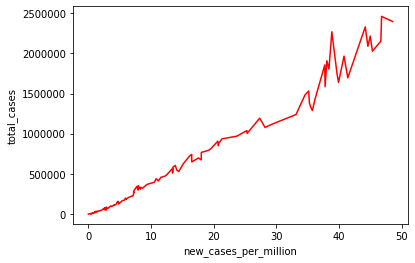

In [55]:
sns.lineplot(x="new_cases_per_million", y="total_cases", data=data1,color='r')

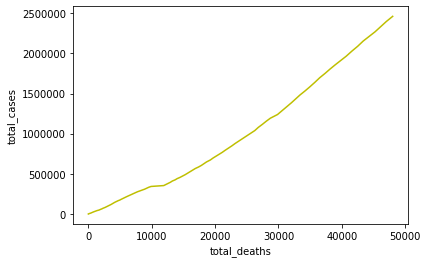

In [56]:
sns.lineplot(x="total_deaths", y="total_cases", data=data1,color='y')

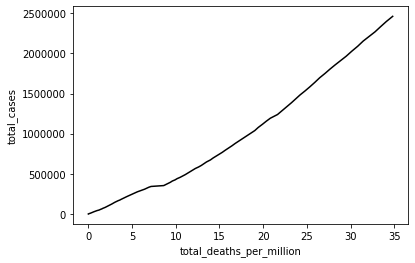

In [57]:
sns.lineplot(x="total_deaths_per_million",y="total_cases",data=data1,color='0')

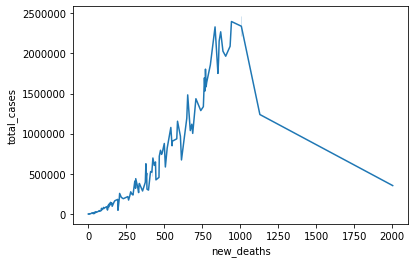

In [58]:
sns.lineplot(x="new_deaths", y="total_cases", data=data1)

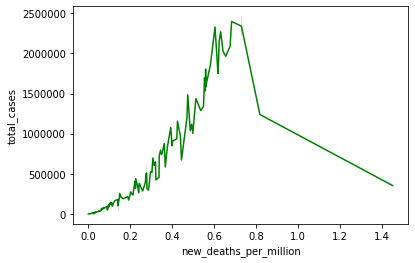

In [59]:
sns.lineplot(x="new_deaths_per_million", y="total_cases", data=data1,color='g')

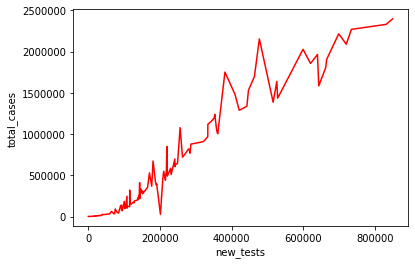

In [60]:
sns.lineplot(x="new_tests", y="total_cases", data=data1,color='r')

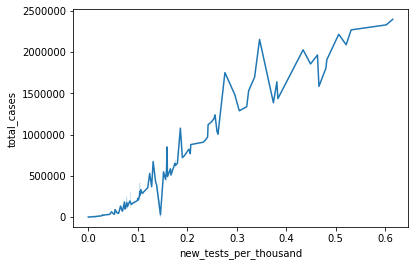

In [61]:
sns.lineplot(x="new_tests_per_thousand", y="total_cases", data=data1)

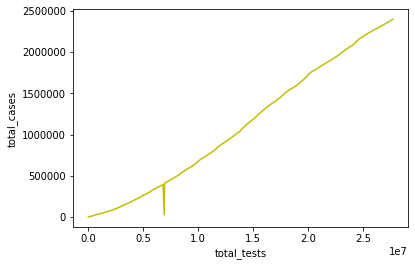

In [62]:
sns.lineplot(x="total_tests", y="total_cases", data=data1,color='y')

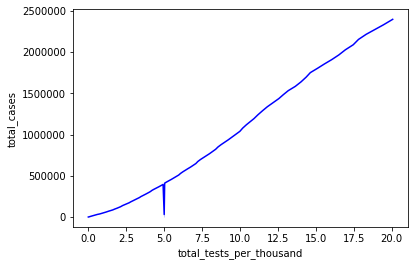

In [63]:
sns.lineplot(x="total_tests_per_thousand",y="total_cases", data=data1,color='b')

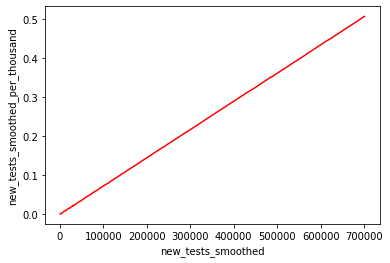

In [64]:
sns.lineplot(x="new_tests_smoothed", y="new_tests_smoothed_per_thousand", data=data1,color='r')

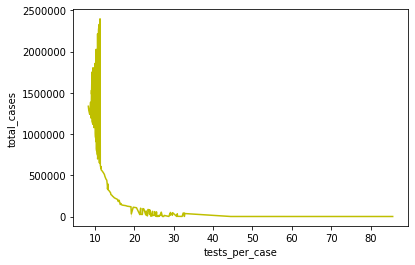

In [65]:
sns.lineplot(x="tests_per_case", y="total_cases", data=data1,color='y')

### CONVERTING DATE COLUMN INTO ORDINAL VALUES:

In [26]:
import datetime as dt        #importing datetime module
data1["date"]=pd.to_datetime(data1["date"])
data1["date"]=data1["date"].map(dt.datetime.toordinal)

C:\Users\ELCOT\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\ELCOT\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [27]:
data1.head()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
15408,IND,Asia,India,737424,0.0,0.0,0.0,0.0,0.0,0.0,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
15409,IND,Asia,India,737425,0.0,0.0,0.0,0.0,0.0,0.0,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
15410,IND,Asia,India,737426,0.0,0.0,0.0,0.0,0.0,0.0,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
15411,IND,Asia,India,737427,0.0,0.0,0.0,0.0,0.0,0.0,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
15412,IND,Asia,India,737428,0.0,0.0,0.0,0.0,0.0,0.0,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66


The dates from the date column are converted into the ordinal numbers.

### DROPPING USELESS COLUMNS:
The useless columns are considered as noise and these columns should be removed from the dataset, below are limitations  of useless columns present in the dataset:<br/>
    1.It decreases the accuracy of the Machine Learning model<br/>
    2.It increases the computational power<br/>
    3.It increases the cost<br/>

In [28]:
df=data1.drop(["iso_code","tests_units","continent","location"],axis=1)

In [29]:
df.head()

,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
15408,737424,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,201164.437956,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
15409,737425,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,201164.437956,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
15410,737426,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,201164.437956,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
15411,737427,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,201164.437956,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
15412,737428,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,201164.437956,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66


In [30]:
df.isna().sum()

date                               0
total_cases                        0
new_cases                          0
total_deaths                       0
new_deaths                         0
total_cases_per_million            0
new_cases_per_million              0
total_deaths_per_million           0
new_deaths_per_million             0
new_tests                          0
total_tests                        0
total_tests_per_thousand           0
new_tests_per_thousand             0
new_tests_smoothed                 0
new_tests_smoothed_per_thousand    0
tests_per_case                     0
positive_rate                      0
stringency_index                   0
population                         0
population_density                 0
median_age                         0
aged_65_older                      0
aged_70_older                      0
gdp_per_capita                     0
extreme_poverty                    0
cardiovasc_death_rate              0
diabetes_prevalence                0
f

There is no null values present in the dataset

### Correlation:

   Correlation coefficients are used in statistics to measure how strong a relationship is between two variables. There are several types of correlation coefficient: Pearson’s correlation (also called Pearson’s R) is a correlation coefficient commonly used in linear regression.

   Correlation coefficient formulas are used to find how strong a relationship is between data. The formulas return a value between -1 and 1, where:<br/>
1.)1 indicates a strong positive relationship.<br/>
2.)-1 indicates a strong negative relationship.<br/>
3.)A result of zero indicates no relationship at all.<br>



In [30]:
df.corr()                          #it returns the correlation values of each and every columns

,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
date,1.000000e+00,7.556238e-01,7.928610e-01,8.072670e-01,8.116012e-01,7.556238e-01,7.928613e-01,8.072679e-01,8.116133e-01,4.266380e-01,...,7.782650e-15,-7.782650e-15,7.782650e-15,7.782650e-15,-7.782650e-15,7.782650e-15,7.782650e-15,7.782650e-15,-7.782650e-15,7.782650e-15
total_cases,7.556238e-01,1.000000e+00,9.907077e-01,9.895938e-01,8.765606e-01,1.000000e+00,9.907078e-01,9.895938e-01,8.766414e-01,8.419164e-01,...,-2.336471e-15,-1.468819e-15,-4.992725e-17,-1.714223e-15,-1.819901e-15,1.306747e-15,1.683153e-15,-1.878141e-16,2.865143e-15,-2.865143e-15
new_cases,7.928610e-01,9.907077e-01,1.000000e+00,9.931619e-01,8.932276e-01,9.907077e-01,1.000000e+00,9.931620e-01,8.933005e-01,8.170502e-01,...,-1.476209e-15,1.379340e-15,-1.110793e-15,-6.723932e-17,-1.040916e-16,7.477663e-16,-9.609619e-16,1.444486e-15,-2.158487e-15,2.158487e-15
total_deaths,8.072670e-01,9.895938e-01,9.931619e-01,1.000000e+00,9.066835e-01,9.895938e-01,9.931620e-01,1.000000e+00,9.067370e-01,8.140328e-01,...,1.054464e-15,9.677226e-16,-1.474918e-15,1.476778e-15,2.438786e-15,-8.192237e-16,-1.502457e-15,1.279901e-15,1.709342e-15,-1.709342e-15
new_deaths,8.116012e-01,8.765606e-01,8.932276e-01,9.066835e-01,1.000000e+00,8.765606e-01,8.932271e-01,9.066825e-01,9.999994e-01,6.765714e-01,...,2.399808e-16,1.610271e-15,-1.381138e-15,-1.391546e-15,-1.628547e-15,8.617634e-16,-1.196704e-15,-2.202859e-15,1.527778e-15,-1.527778e-15
total_cases_per_million,7.556238e-01,1.000000e+00,9.907077e-01,9.895938e-01,8.765606e-01,1.000000e+00,9.907078e-01,9.895938e-01,8.766414e-01,8.419164e-01,...,2.502334e-16,1.762833e-16,-1.957381e-16,-1.174210e-16,6.469710e-17,3.453042e-17,2.484957e-16,-4.745806e-17,-5.734515e-16,5.734515e-16
new_cases_per_million,7.928613e-01,9.907078e-01,1.000000e+00,9.931620e-01,8.932271e-01,9.907078e-01,1.000000e+00,9.931621e-01,8.932999e-01,8.170500e-01,...,-1.946183e-16,3.744200e-17,-1.125903e-16,-8.212069e-17,2.363421e-16,-1.227700e-16,-3.171558e-16,2.187281e-17,-1.536223e-16,1.536223e-16
total_deaths_per_million,8.072679e-01,9.895938e-01,9.931620e-01,1.000000e+00,9.066825e-01,9.895938e-01,9.931621e-01,1.000000e+00,9.067361e-01,8.140330e-01,...,-9.473738e-17,-4.540192e-16,-2.961790e-16,5.876567e-17,1.772011e-16,2.760091e-16,-3.039491e-16,1.702178e-17,-3.325157e-16,3.325157e-16
new_deaths_per_million,8.116133e-01,8.766414e-01,8.933005e-01,9.067370e-01,9.999994e-01,8.766414e-01,8.932999e-01,9.067361e-01,1.000000e+00,6.766430e-01,...,3.266665e-16,4.585550e-16,-5.834717e-16,-8.132010e-17,3.735642e-16,-4.131586e-16,-6.878325e-16,-1.962899e-16,-1.000618e-16,1.000618e-16
new_tests,4.266380e-01,8.419164e-01,8.170502e-01,8.140328e-01,6.765714e-01,8.419164e-01,8.170500e-01,8.140330e-01,6.766430e-01,1.000000e+00,...,-3.927123e-16,-1.066152e-15,-2.103735e-16,-9.673927e-16,1.163459e-15,4.842994e-17,7.584791e-16,2.023467e-16,1.010263e-15,-1.010263e-15


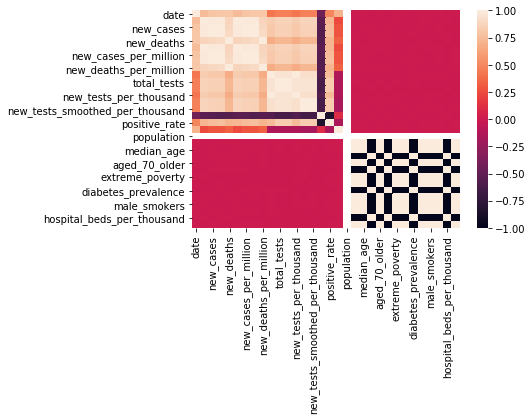

In [31]:
sns.heatmap(df.corr())     #heatmaps are used to visualize the correlation between the datas.

### MODEL DEVELOPMENT:

The following are the steps involved in the development of model;
1. Extract Data<br/>
a. There should be no null values<br/>
b. The features should not have strings<br/>
c. The features should be of the type array/ dataframe<br/>
d. The features should be in the form of rows and columns
2. Splitting into train and test data
3. Linear Regression and Random Forest Regressor Parameter Evaluation
4. Training on train data
5. Evaluating on test data

### EXTRACTION:

In [31]:
x=df.drop(["total_cases"],axis=1)     #feature variables

In [32]:
y=df["total_cases"]                  #target variable

Linear Regression Parameter Evaluation:

In [33]:
from sklearn.linear_model import LinearRegression    #importing linear regression model from scikit learn packages

In [34]:
rg=LinearRegression()                                #Linear Regression Instantsiation

In [35]:
from sklearn.model_selection import train_test_split    #Train_test splitting

In [36]:
import numpy as np                                         #Parameter Tuning
test=[0.2,0.3,0.4,0.5]
list=[22,32,42,52]
trainscore=[]
testscore=[]
diff=[]
parameter=[]
for values in test:
    for states in list:
        x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=values,random_state=states)
        rg=LinearRegression()
        rg.fit(x_train,y_train)
        y_pred=rg.predict(x_test)
        from sklearn.metrics import mean_squared_error
        rmse=np.sqrt(mean_squared_error(y_test,y_pred))
        trainaccuracy=rg.score(x_train,y_train)
        testaccuracy=rg.score(x_test,y_test)
        difference=((trainaccuracy)-(testaccuracy))
        trainscore.append(trainaccuracy)
        testscore.append(testaccuracy)
        diff.append(difference)
        parameter.append(rmse)
print(parameter)                                       #evaluating the rmse values

[0.42524740959355656, 0.3724575088539478, 0.39513435078376064, 0.3403648923242656, 0.40930899794888087, 0.3739091391190904, 0.3818712296277941, 0.38709378626138347, 0.44100281278395387, 0.3653770892900593, 0.3816688390078243, 0.3631110363854265, 0.43639675127602595, 0.3562937187892155, 0.3938194926160547, 0.3669467126142838]


In [37]:
print(trainscore)                                   #evaluating train set accuracies values

[0.9999999999996824, 0.9999999999996763, 0.9999999999997249, 0.9999999999996521, 0.9999999999996345, 0.9999999999996781, 0.9999999999997039, 0.9999999999996507, 0.9999999999996911, 0.9999999999996917, 0.9999999999997204, 0.9999999999996004, 0.9999999999997213, 0.9999999999997107, 0.9999999999997401, 0.9999999999996169]


In [38]:
print(testscore)                                    #evaluating test set accuracies values

[0.9999999999994605, 0.9999999999995747, 0.9999999999990951, 0.9999999999997001, 0.9999999999996152, 0.999999999999591, 0.9999999999995377, 0.9999999999996447, 0.9999999999995123, 0.9999999999995821, 0.9999999999995156, 0.999999999999688, 0.9999999999994904, 0.9999999999995678, 0.9999999999994527, 0.9999999999996428]


In [39]:
print(diff)                                         #evaluating differences between accuraices

[2.2182256032010628e-13, 1.0158540675320182e-13, 6.298295218698513e-13, -4.807265696626928e-14, 1.9317880628477724e-14, 8.715250743307479e-14, 1.6620038678638593e-13, 5.995204332975845e-15, 1.7885692926711272e-13, 1.0957901253050295e-13, 2.0483614804334138e-13, -8.759659664292485e-14, 2.3092638912203256e-13, 1.4288570326925765e-13, 2.8743674107545303e-13, -2.5979218776228663e-14]


In [41]:
diff.sort()
print(diff)                                        #sorting to see the positive minimum value

[-8.759659664292485e-14, -4.807265696626928e-14, -2.5979218776228663e-14, 5.995204332975845e-15, 1.9317880628477724e-14, 8.715250743307479e-14, 1.0158540675320182e-13, 1.0957901253050295e-13, 1.4288570326925765e-13, 1.6620038678638593e-13, 1.7885692926711272e-13, 2.0483614804334138e-13, 2.2182256032010628e-13, 2.3092638912203256e-13, 2.8743674107545303e-13, 6.298295218698513e-13]


### The following conditions are to be satisfied in selecting a optimum parameter for the model,<br/>
1.Training accuracy should be greater than the Testing accuracy<br/>
2.Difference between the training and testing accuracy should be smaller<br/>
3.The root mean square error should be lower.<br/>

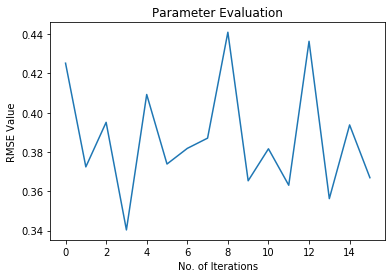

In [40]:
import matplotlib.pyplot as plt
plt.plot(parameter,label="RMSE")
plt.xlabel("No. of Iterations")
plt.ylabel("RMSE Value")
plt.title("Parameter Evaluation")
plt.show()                      #visualizing rmse values with different iterations of test_size and random_states

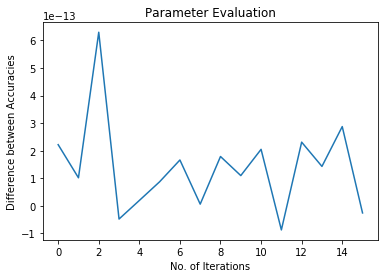

In [41]:
import matplotlib.pyplot as plt
plt.plot(diff,label="Difference")
plt.xlabel("No. of Iterations")
plt.ylabel("Difference between Accuracies")
plt.title("Parameter Evaluation")
plt.show()           #visualizing difference in accuracy values with different iterations of test_size and random_states

From the above graph we can find that the difference between the training and training accuracy is lower at test_size=0.3 and random_state=52.

LINEAR REGRESSION MODEL WITH TRAIN-TEST SPLIT:

In [42]:
from sklearn.linear_model import LinearRegression        #importing linear regression algorithm

In [43]:
reg=LinearRegression()                                  #instantsiating

In [44]:
from sklearn.model_selection import train_test_split    #importing test train split

In [45]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=52)  #creating test train split

In [46]:
print ('Train set:', x_train.shape,  y_train.shape)
print ('Test set:', x_test.shape,  y_test.shape)       #it returns the shape of train and test data sets

Train set: (158, 31) (158,)
Test set: (69, 31) (69,)


In [47]:
reg.fit(x_train,y_train)                       #fiting the model training datas

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [48]:
print ('Coefficients: ', reg.coef_)            #evaluating the slope of the equation

Coefficients:  [ 1.89979532e-03  3.87010284e-02 -9.49337420e-02  4.35769872e-02
  1.38000824e+03 -5.34839594e+01  1.30911223e+02 -6.02149135e+01
 -6.47153278e-05 -3.13894670e-05  4.33376121e+01  8.86161348e+01
  2.75221858e-05 -3.82599505e+01  3.86640857e-04  1.07290579e+01
  1.98482427e-03  0.00000000e+00  0.00000000e+00 -4.28002147e-15
 -1.07000537e-15  2.67501342e-16  5.47842748e-13  0.00000000e+00
 -3.42401717e-14 -1.07000537e-15  2.67501342e-16 -4.28002147e-15
  8.56006186e-15  1.33747441e-16 -1.71202615e-14]


In [49]:
print ('Intercept: ',reg.intercept_)           #evaluating the intercept of the equation

Intercept:  -1401.5977854480152


In [50]:
y_pred=reg.predict(x_test)                   #predicting the result on test datas

In [51]:
from sklearn.metrics import mean_squared_error  #importing model evaluation metrics

In [52]:
mean_squared_error(y_test,y_pred)               #evaluating the mean square error(mse) of the model       

0.14984159936217362

In [53]:
import numpy as np                             #importing numpy library

In [66]:
rmse1=np.sqrt(mean_squared_error(y_test,y_pred))
print("The root mean square error is:",rmse1)    #evaluating the root mean square(rmse) of the model

The root mean square error is: 0.38709378626138347


In [55]:
trainingaccuracy=reg.score(x_train,y_train)
print("Train set Accuracy:",trainaccuracy)    #evaluating the training accuracy

Train set Accuracy: 0.9999999999996169


In [56]:
testingaccuracy=reg.score(x_test,y_test)
print("Test set Accuracy:",testaccuracy)       #evaluating the testing accuracy

Test set Accuracy: 0.9999999999996428


In [57]:
differ=(trainingaccuracy)-(testingaccuracy)
print(differ)                                  #evaluating difference between train and test accuries

5.995204332975845e-15


In [61]:
import matplotlib.pyplot as plt
import seaborn as sns

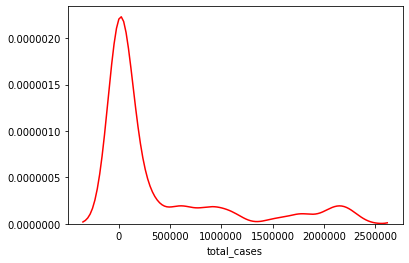

In [298]:
sns.distplot(y_test,hist=False, color="r")

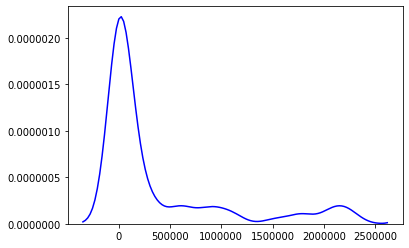

In [297]:
sns.distplot(y_pred,hist=False, color="b")

The plot shows the curves of y_test datas and y_pred datas

In [88]:
df=pd.read_excel("New-Data.xlsx")
df.head()                            #Raw Datas to be predicted by linear regression model

,date,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,total_tests,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
0,2020-08-20,2465690,66053,49090,1059,1833.225,49.107,35.044,0.751,948762,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
1,2020-08-25,2470190,67553,50140,1111,1882.555,47.997,34.601,0.783,961062,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
2,2020-08-30,2474690,69053,51190,1163,1931.995,50.097,35.589,0.738,973407,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
3,2020-09-05,2479190,70553,52240,1215,1981.315,50.217,35.245,0.703,989085,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
4,2020-09-10,2483690,72053,53290,1267,2030.855,50.667,34.681,0.623,1007985,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66


In [89]:
import datetime as dt                                      #importing datetime module
df["date"]=pd.to_datetime(df["date"])
df["date"]=df["date"].map(dt.datetime.toordinal)

In [90]:
df.head()                                                #dates are converted into ordinal numerical values

,date,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,total_tests,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
0,737657,2465690,66053,49090,1059,1833.225,49.107,35.044,0.751,948762,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
1,737662,2470190,67553,50140,1111,1882.555,47.997,34.601,0.783,961062,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
2,737667,2474690,69053,51190,1163,1931.995,50.097,35.589,0.738,973407,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
3,737673,2479190,70553,52240,1215,1981.315,50.217,35.245,0.703,989085,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
4,737678,2483690,72053,53290,1267,2030.855,50.667,34.681,0.623,1007985,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66


In [91]:
reg.predict(df)                                      #predicting the new datas

array([1.25517207e+09, 1.31355962e+09, 1.40993439e+09, 1.55981217e+09,
       1.70969000e+09])

In [92]:
dict={'total_cases':[1.25517207e+09, 1.31355962e+09, 1.40993439e+09, 1.55981217e+09,
       1.70969000e+09]}
print(dict)                                          #storing the predicted results in a dictionary

{'total_cases': [1255172070.0, 1313559620.0, 1409934390.0, 1559812170.0, 1709690000.0]}


In [93]:
df_pred=pd.DataFrame(dict)
df_pred.head()                                      #converting the dictionary into a data frame

,total_cases
0,1.255172e+09
1,1.313560e+09
2,1.409934e+09
3,1.559812e+09
4,1.709690e+09


RANDOM FOREST REGRESSOR MODEL WITH GRID-SEARCH:

In [299]:
from sklearn.ensemble import RandomForestRegressor       #importing random forest algorithm from scikit learn packages

In [300]:
random=RandomForestRegressor(criterion='mse')             #instantsiation

In [3]:
from sklearn.model_selection import train_test_split    #importing train_test split

In [4]:
from sklearn.model_selection import GridSearchCV        #importing grid search cv hyper-parameter optimation function

In [ ]:
X_train,X_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=30,stratify = y)   
#creating test train split

In [304]:
parameters1= [{'n_estimators': [50,60,70,80,90,100]}]       #creating a dictionatary of required parameters

In [305]:
grid=GridSearchCV(random,param_grid=parameters1)           #instantiating

In [306]:
grid.fit(X_train,y_train)                                   #fitting the model with train set datas

GridSearchCV(cv=None, error_score=nan,
             estimator=RandomForestRegressor(bootstrap=True, ccp_alpha=0.0,
                                             criterion='mse', max_depth=None,
                                             max_features='auto',
                                             max_leaf_nodes=None,
                                             max_samples=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             n_estimators=100, n_jobs=None,
                                             oob_score=False, random_state=None,
                                             verbose=0, warm_start=False),
             iid='deprecated', n

In [307]:
grid.predict(X_test)                                        #predicting the model with test set datas

array([1.42715160e+05, 4.23760000e+02, 1.29436000e+03, 1.75467644e+06,
       4.32857000e+04, 1.07256870e+06, 1.04492620e+05, 4.00000000e-02,
       0.00000000e+00, 2.29026000e+04, 2.38563380e+05, 0.00000000e+00,
       2.21530008e+06, 1.52260000e+02, 4.92000000e+00, 5.99172000e+03,
       5.74000000e+02, 2.84136000e+03, 2.52112800e+04, 3.00000000e+00,
       3.00000000e+00, 1.84466574e+06, 0.00000000e+00, 0.00000000e+00,
       2.17586872e+06, 3.31481340e+05, 4.59656500e+05, 1.37532308e+06,
       1.10002380e+06, 3.92548000e+03, 6.30163000e+04, 2.51782620e+05,
       9.15781700e+05, 8.27449400e+04, 1.17543760e+05, 5.19395600e+04,
       2.94000000e+00, 3.01453600e+04, 3.65434000e+04, 3.35602000e+04,
       5.73997880e+05, 1.04368152e+06, 2.59800000e+01, 1.61095600e+05,
       9.91420000e+02, 3.00000000e+00, 4.83074000e+03, 1.37765216e+06,
       3.00000000e+00, 3.00000000e+00, 1.21119326e+06, 3.00000000e+00,
       3.00000000e+00, 2.00107400e+04, 7.66632800e+04, 9.74139120e+05,
      

In [308]:
train_accuracy=grid.score(X_train,y_train)
print("The Training Set Accuracy is:",train_accuracy)       #evaluating the train set accuracies

The Training Set Accuracy is: 0.9995521819334695


In [309]:
test_accuracy=grid.score(X_test,y_test)
print("The Testing Set Accuracy is:",test_accuracy)         #evaluating the test set accuracies

The Testing Set Accuracy is: 0.967549104851435


In [310]:
differ=(train_accuracy)-(test_accuracy)                     #evalating the difference in accuracies
print("The difference between train and test accuracies is:",differ)

The difference between train and test accuracies is: 0.03200307708203454


In [311]:
grid.best_params_                                           #printing the best parameters

{'n_estimators': 50}

In [312]:
grid.best_score_                                           #printing the best score

0.9970102156377736

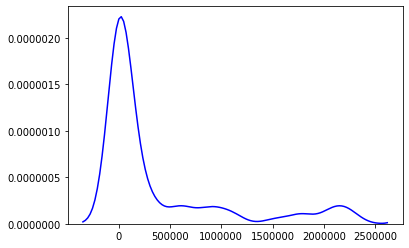

In [313]:
sns.distplot(y_pred,hist=False, color="b")

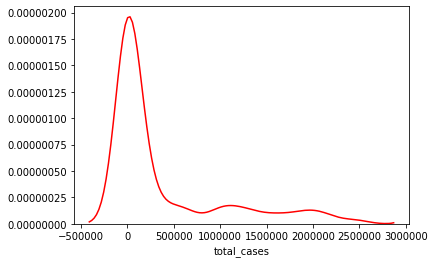

In [314]:
sns.distplot(y_test,hist=False, color="r")

The plots shows the curves of actual and predicted values

In [316]:
df.head()                                             #New Datas to be predicted

,date,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,new_tests,total_tests,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
0,737657,2465690,66053,49090,1059,1833.225,49.107,35.044,0.751,948762,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
1,737662,2470190,67553,50140,1111,1882.555,47.997,34.601,0.783,961062,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
2,737667,2474690,69053,51190,1163,1931.995,50.097,35.589,0.738,973407,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
3,737673,2479190,70553,52240,1215,1981.315,50.217,35.245,0.703,989085,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66
4,737678,2483690,72053,53290,1267,2030.855,50.667,34.681,0.623,1007985,...,3.414,6426.674,21.2,282.28,10.39,1.9,20.6,59.55,0.53,69.66


In [317]:
grid.predict(df)                                      #predicting on new datas

array([1924687.46, 1904086.66, 1927938.38, 1927938.38, 1927938.38])

In [318]:
dict2={'total_cases':[1924687.46, 1904086.66, 1927938.38, 1927938.38, 1927938.38]}
print(dict2)                                        #storing the predicted results in a dictionary

{'total_cases': [1924687.46, 1904086.66, 1927938.38, 1927938.38, 1927938.38]}


In [319]:
df_pred=pd.DataFrame(dict2)
df_pred.head()                                      #converting the dictionary into a data frame

,total_cases
0,1924687.46
1,1904086.66
2,1927938.38
3,1927938.38
4,1927938.38


### CONCLUSION:

Different Machine learning models yields different results and the selection depends on the performance metrics such as accuracy sores, root mean square error values, presicion scores etc.,,,

The results of test accuracies of Linear Regression and Random Forest Regressor model are tabulated in the form of data frame.

In [320]:
dic={"Linear Regression Model":[0.9999],"Random Forest Regressor model":[ 0.9675]}
table=pd.DataFrame(dic)
print(table)

   Linear Regression Model  Random Forest Regressor model
0                   0.9999                         0.9675


We can see from the results that linear regression model with defined parameters predict the results with test greater accuracies.